# The modelling error is:
$$\delta e_{sys} = (e-e_{PSF}) \left( \frac{T_{PSF}}{T_{gal}} \right) \frac{\delta T_{PSF}}{T_{PSF}} - \left( \frac{T_{PSF}}{T_{gal}} \right)\delta e_{PSF}$$


## Propagate into shear errors:
$\rho$ statistics:

$$\rho_1 = \left\langle \delta e_{PSF}^*(x) \; \delta e_{PSF} (x+\theta) \right\rangle$$

$$\rho_2 = \left\langle e_{PSF}^* (x) \; \delta e_{PSF} (x+\theta) \right\rangle $$
$$\rho_3 = \left\langle \left( e_{PSF}^*   \frac{\delta T_{PSF}}{T_{PSF}}\right)(x) \; \left(e_{PSF}   \frac{\delta T_{PSF}}{T_{PSF}}\right)(x+\theta)\right\rangle $$
$$\rho_4 = \left\langle \delta e_{PSF}^* (x)\;\left( e_{PSF} \frac{\delta T_{PSF}}{T_{PSF}}\right)(x+\theta)\right\rangle $$
$$\rho_5 = \left\langle e_{PSF}^* (x)\; \left(e_{PSF} \frac{\delta T_{PSF}}{T_{PSF}}\right)(x+\theta) \right\rangle $$

Then

$$\delta \xi_+ (\theta) = 2 \left\langle \frac{T_{PSF}}{T_{gal}} \frac{\delta T_{PSF}}{T_{PSF}} \right\rangle \xi_+(\theta)
 + \left\langle \frac{T_{PSF}}{T_{gal}} \right\rangle^2 \rho_1(\theta)
 - \alpha\left\langle\frac{T_{PSF}}{T_{gal}}\right\rangle \rho_2(\theta) 
 + \left\langle \frac{T_{PSF}}{T_{gal}} \right\rangle^2 \rho_3(\theta)
 + \left\langle \frac{T_{PSF}}{T_{gal}} \right\rangle^2 \rho_4(\theta)
 - \alpha\left\langle\frac{T_{PSF}}{T_{gal}}\right\rangle \rho_5(\theta) 
$$

# Dither patterns available to use:
    - fieldRA                     | fieldDec
    - hexDitherFieldPerNightRa    | hexDitherFieldPerNightDec
    - hexDitherFieldPerVisitRa    | hexDitherFieldPerVisitDec
    - randomDitherFieldPerNightRa | randomDitherFieldPerNightDec
    - randomDitherFieldPerVisitRa | randomDitherFieldPerVisitDec
    - spiralDitherFieldPerNightRa | spiralDitherFieldPerNightDec
    - spiralDitherFieldPerVisitRa | spiralDitherFieldPerVisitDec
    
The methods should be called with 'pattern_timescale', e.g. 'random_night'

###  Examples:

In [55]:
import seaborn as sns; sns.set_style('darkgrid')
sns.set_context('talk',font_scale=2)


Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Healpix slicer using NSIDE=128, approximate resolution 27.483891 arcminutes
Querying database with constraint filter = "r" and night < 3653 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 231968 visits
Running:  ['spiral dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
231968


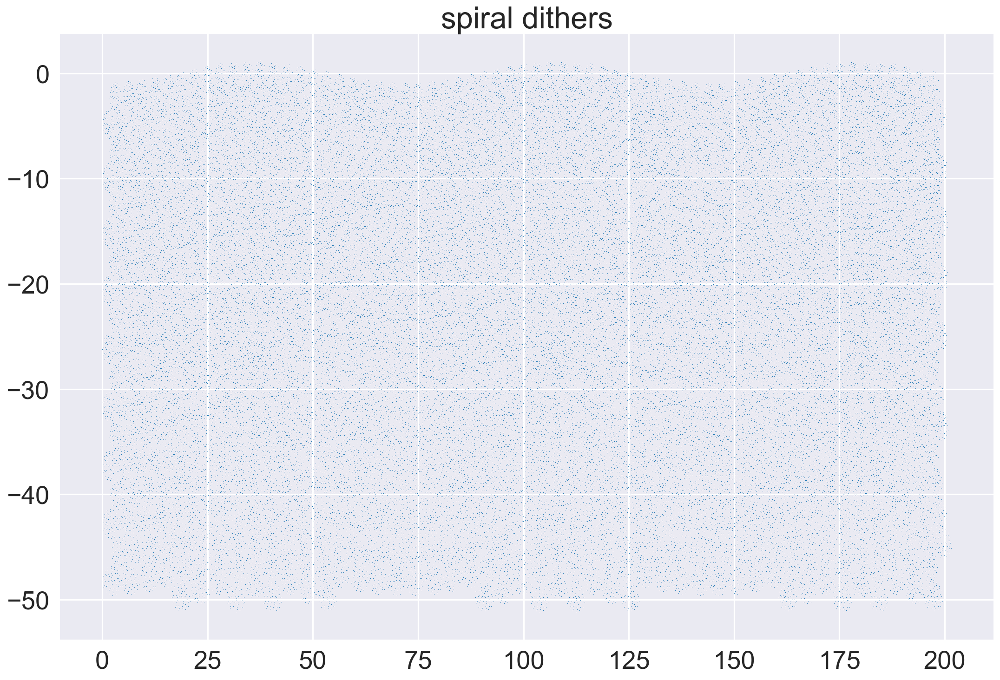

In [10]:
myBundles = {}
nside = 128
runName = '/Users/myhome/Downloads/minion_1012'
opsdb = db.OpsimDatabase(runName + '_sqlite.db')
outDir = 'dither_test'
resultsDb = db.ResultsDb(outDir=outDir)


metric = metrics.CountMetric('expMJD')
slicer0 = slicers.HealpixSlicer(lonCol='fieldRA', latCol='fieldDec', nside=nside)  
sqlconstraint = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
stackerList = [stackers.SpiralDitherFieldPerNightStacker(nCoils=7)]
slicer3 = slicers.HealpixSlicer(lonCol='spiralDitherFieldPerNightRa', latCol='spiralDitherFieldPerNightDec', nside=nside)
myBundles['spiral dither'] = metricBundles.MetricBundle(metric, slicer3, sqlconstraint, 
                                                       stackerList=stackerList, runName=runName,
                                                       metadata='spiral dither')

outDir = 'dither_test'
resultsDb = db.ResultsDb(outDir=outDir)
bgroup = metricBundles.MetricBundleGroup(myBundles, opsdb, outDir=outDir, resultsDb=resultsDb)
bgroup.runAll() 
plt.plot(np.array(bgroup.simData['spiralDitherFieldPerNightRa'])*180/np.pi,np.array(bgroup.simData['spiralDitherFieldPerNightDec'])*180/np.pi,',')
plt.title('spiral dithers')
print len(bgroup.simData['spiralDitherFieldPerNightRa'])

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 3653 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 260016 visits
Running:  ['dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
260016


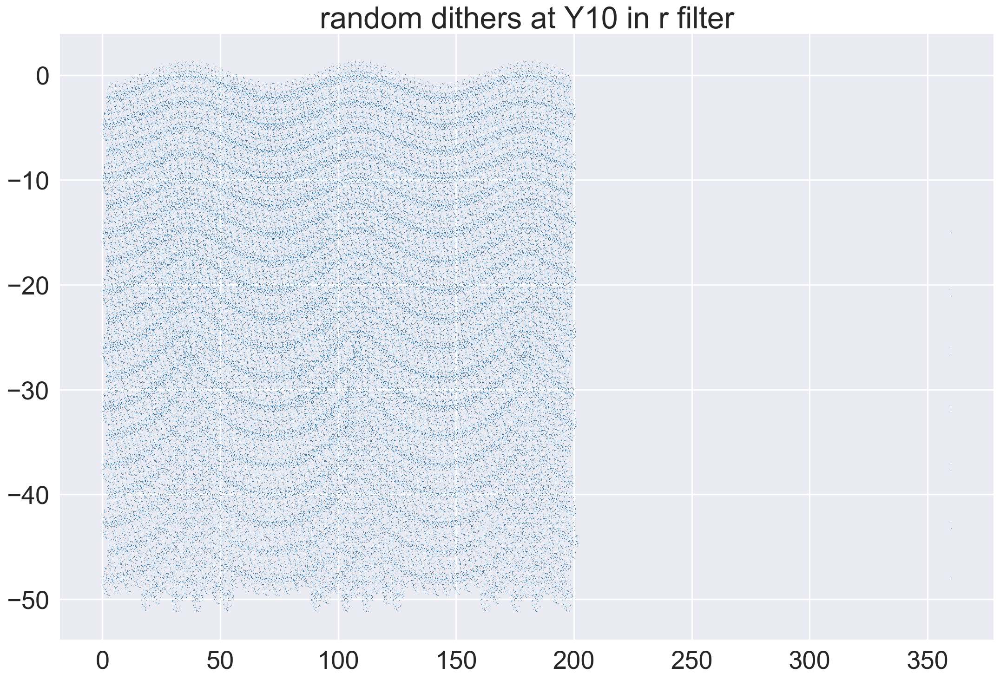

In [12]:
runName = '/Users/myhome/Downloads/minion_1012'
opsdb = db.OpsimDatabase(runName + '_sqlite.db')
outDir = 'dither_test'
resultsDb = db.ResultsDb(outDir=outDir)

slicer = slicers.HealpixSlicer(nside=64, lonCol='randomDitherFieldPerNightRa', latCol='randomDitherFieldPerNightDec')
sqlconstraint = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
metric = metrics.CountMetric(col='night')
stackerList = [stackers.RandomDitherFieldPerNightStacker()]
bundle = metricBundles.MetricBundle(metric, slicer, sqlconstraint, runName=runName, 
                                    stackerList=stackerList)
bgroup = metricBundles.MetricBundleGroup({'dither':bundle}, opsdb, outDir=outDir, resultsDb=resultsDb)
bgroup.runAll()
plt.plot(np.array(bgroup.simData['randomDitherFieldPerNightRa'])*180/np.pi,np.array(bgroup.simData['randomDitherFieldPerNightDec'])*180/np.pi,',')
plt.title('random dithers at Y10 in r filter')
print len(bgroup.simData['randomDitherFieldPerNightRa'])

260016


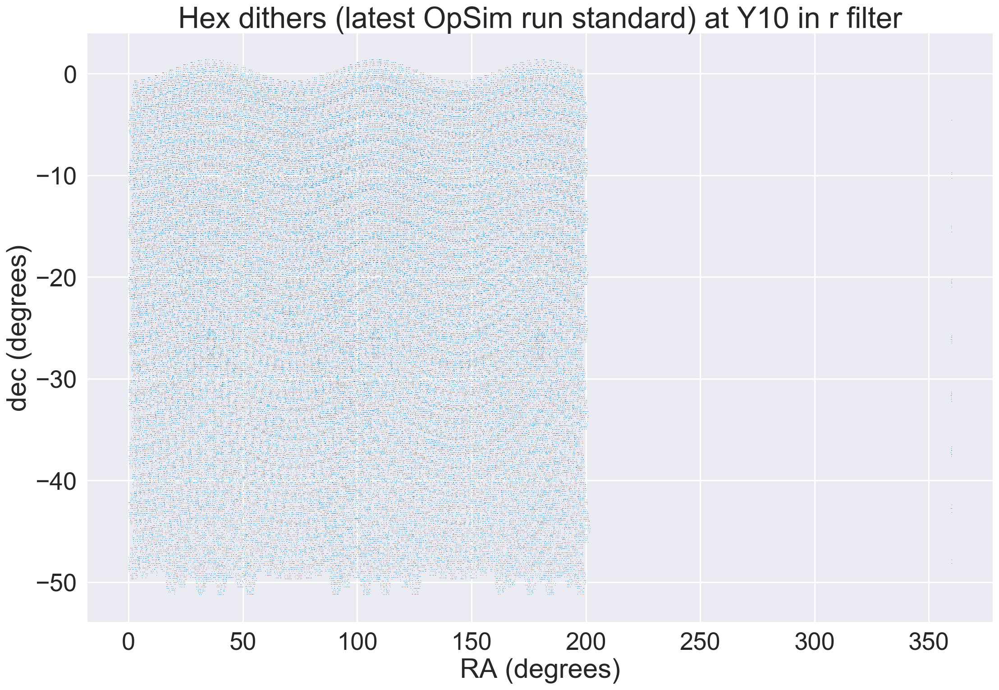

In [13]:
database = '/Users/myhome/Downloads/minion_1012_sqlite.db'
opsdb = db.OpsimDatabase(database)

sqlWhere = 'filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50))
sns.set_style('darkgrid')
pos = opsdb.fetchMetricData(('ditheredRA', 'ditheredDec'), sqlconstraint=sqlWhere)
pos = np.array(pos)
if any(row[1] == x for row in pos):
    pos2 = zip(*pos)[1]
if any(row[2] == x for row in pos):
    pos3 = zip(*pos)[2]
pos2,pos3 = np.array(map(lambda x: np.array(x)*180/np.pi,(pos2,pos3)))
plt.plot(pos2,pos3,',')
#plt.xlim(-50,250)
plt.xlabel('RA (degrees)')
plt.ylabel('dec (degrees)')
plt.title('Hex dithers (latest OpSim run standard) at Y10 in r filter')
print len(pos2)
#plt.savefig('/Users/myhome/Desktop/miniondithersdark.png')

In [2]:
def ditherplot(obj, statistic='median',**kwargs):
    if 'DELTA' in str(obj):
        title = 'median residual elipticity: {:.5f}'
    elif 'STAR in str(obj)':
        title = 'median star elipticity : {:.5f}'
    else:
        raise NameError('''obj should have STAR or DELTA.''')
    X = np.array(obj.e.keys())[:,0]
    Y = np.array(obj.e.keys())[:,1]
    e1 = np.array(obj.e.values())[:,0]
    e2 = np.array(obj.e.values())[:,1]
    lengths = np.sqrt(e1**2+e2**2)
    angles = np.array([r2d(0.5*np.arctan2(ei2,ei1)) for ei1,ei2 in zip(e1,e2)])
    pixel_scale = r2d(1)
    U = lengths*np.cos(angles)
    V = lengths*np.sin(angles)
    Q = plt.quiver(pixel_scale*X,Y*pixel_scale,U,V,angles=angles,
                   headlength=0,headaxislength=0,units='height',**kwargs);
    plt.xlabel('RA (degrees)')
    plt.ylabel('dec (degrees)')
    if statistic=='median':
        plt.title(title.format(np.median(lengths)))
    elif statistic=='mean':
        title.replace('median','mean')
        plt.title(title.format(np.mean(lengths)))

In [3]:
import seaborn
def corrplot(r, xi, sigma=np.array([None]),color='b',scale='log'):
    if sigma.all()!=None:
#         def _plot_std_bars(std=None, central_data=None, ci=None, data=None,*args, **kwargs):
#             std = sigma
#             ci = np.asarray((central_data - std, central_data + std))
#             kwargs.update({"central_data": central_data, "ci": ci, "data": data})
#             seaborn.timeseries._plot_ci_band(*args, **kwargs)
#         seaborn.timeseries._plot_std_bars = _plot_std_bars
        ax = sns.tsplot(xi,r,color=color, n_boot=0)
        ax.errorbar(r, xi, yerr=sigma, fmt=None,color=color)


    else:
        sns.tsplot(xi,r,color=color)
    plt.xlabel(r'$\theta$ (degrees)')
    # plt.ylabel(r'$\xi_+$')
    plt.xscale('log')
    plt.yscale(scale)


In [105]:
from __future__ import division
%pylab inline
from scipy import stats
from angles import r2d, r2arcs, d2arcs, arcs2r
def arcm2r(theta):
    return arcs2r(theta*60)
import seaborn as sns;sns.set_style('darkgrid')
import lsst.sims.maf.stackers as stackers
import treecorr as tr, healpy as hp
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.figsize'] = 18,12
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.metricBundles as metricBundles
import lsst.sims.maf.db as db
from lsst.sims.maf.plots import PlotHandler
from collections import defaultdict
import treecorr
from itertools import chain
sns.set_context('poster',font_scale=1.7)

class ModelErrors():
    
    def __init__(self,ModelType,WorstCase,DitherPattern):
        self.fwhm = 0.7 #arcsec
        self.sigma = self.fwhm/(2*np.sqrt(2*np.log(2)))
        self.TrM = 2*self.sigma**2
        self.T_gal = self.TrM
        self.T_PSF = self.TrM
        self.PSF.TrM = self.TrM
        self.STAR.TrM = self.TrM
        self.alpha = 0.01
        self.ModelType = ModelType
        self.survey_area = (np.radians(200),np.radians(50)) # in radians
        self.star_num = 10000
        stars_X = np.random.rand(int(self.star_num))*self.survey_area[0] 
        Y = 0.77*np.random.rand(int(self.star_num))/2 +0.5  #*self.survey_area[1] - self.survey_area[1]
        stars_Y = np.arccos(2*Y-1)-np.pi/2
        stars = np.array((stars_X,stars_Y))
        self.stars = stars.swapaxes(1,0)
        self.DELTA.e = defaultdict(np.array)
        self.DELTA.M = defaultdict(np.array)
        self.STAR.M = defaultdict(np.array)
        self.STAR.e = defaultdict(np.array)
        self.PSF.M = defaultdict(np.array)
        self.PSF.e = defaultdict(np.array)
        self.counter = defaultdict(int)
        self.ksstatistic = []
        self.pvalues = []
        self.Worst = WorstCase
        self.DitherPatterns = {'random_night': 'randomDitherFieldPerNight', 'random_visit':'randomDitherFieldPerVisit',
                              'spiral_night': 'spiralDitherFieldPerNight', 'spiral_visit':'spiralDitherFieldPerVisit',
                              'hex_night': 'hexDitherFieldPerNight', 'hex_visit': 'hexDitherFieldPerVisit',
                              'field':'field'}
        self.Stackers = {'random_night':stackers.RandomDitherFieldPerNightStacker(),
                        'random_visit':stackers.RandomDitherFieldPerVisitStacker(),
                        'spiral_night':stackers.SpiralDitherFieldPerNightStacker(),
                        'spiral_visit':stackers.SpiralDitherFieldPerVisitStacker(),
                        'hex_night':stackers.HexDitherFieldPerNightStacker(),
                        'hex_visit':stackers.HexDitherFieldPerVisitStacker(),
                        'field':stackers.RandomDitherFieldPerNightStacker()} # choosing anything for field -- doesn't really matter
        if DitherPattern not in self.DitherPatterns.keys():
            raise ValueException('Dither Pattern not supported, please choose from:\
                                 field, random_night, random_visit, spiral_night, spiral_visit, hex_night, hex_visit')
        else:
            self.DitherPattern = self.DitherPatterns[DitherPattern]
            self.Stacker = self.Stackers[DitherPattern]
        
        self.savedStarsAngles = {tuple(k):[0] for k in self.stars}
        
        # Getting requirements on rho and xi_+ from HSC data. 
        HSCCosmicShear = np.loadtxt('HSCS16A_combinedarea_1000rea_full_xi_p.mean_sqrtvar')
        self.reqs_r = arcm2r(1)*HSCCosmicShear[:,0]
        self.HSCCosmicShear_xip = HSCCosmicShear[:,1]/2.6
        rho_reqs = np.loadtxt('rho_requirements.txt')
        lsst_area = 18000.
        hsc_area = 136.
        self.rho25_reqs = 0.02/self.alpha * np.sqrt(hsc_area/lsst_area) * rho_reqs[:,2]/(self.T_PSF/self.T_gal)**2
        self.rho134_reqs = np.sqrt(hsc_area/lsst_area) * rho_reqs[:,1]/(self.T_PSF/self.T_gal)
        
        
    class PSF:
        '''empty namespace to organise results into
        '''
        pass
    
    class STAR:
        '''empty namespace to organise results into
        '''
        pass
    
    class DELTA:
        '''empty namespace to organise results into
        '''
        pass
                
    def getPositions(self,sqlWhere,runName='/Users/myhome/Downloads/minion_1012'):
        '''uses OpSim to find all dithered positions given some constraint sqlWhere
        '''
        print 'getting the dither positions from the database'
        opsdb = db.OpsimDatabase(runName + '_sqlite.db')
        outDir = 'dither_test'
        resultsDb = db.ResultsDb(outDir=outDir)
        if self.DitherPattern=='field':
            slicer = slicers.HealpixSlicer(nside=64, lonCol='fieldRA', latCol='fieldDec')
        else:
            slicer = slicers.HealpixSlicer(nside=64, lonCol=self.DitherPattern+'Ra', latCol=self.DitherPattern+'Dec')
        sqlconstraint = sqlWhere
        metric = metrics.CountMetric(col='night')
        stackerList = [self.Stacker]
        bundle = metricBundles.MetricBundle(metric, slicer, sqlconstraint, runName=runName, 
                                            stackerList=stackerList)
        bgroup = metricBundles.MetricBundleGroup({self.DitherPattern+' dither':bundle}, opsdb, outDir=outDir, resultsDb=resultsDb)
        bgroup.runAll()
        if self.DitherPattern=='field':
            print self.DitherPattern
            posRA = bgroup.simData['fieldRA']
            posDec = bgroup.simData['fieldDec']
        else:
            print self.DitherPattern
            posRA = bgroup.simData[self.DitherPattern+'Ra']
            posDec = bgroup.simData[self.DitherPattern+'Dec']
        pos = np.array((posRA,posDec))
        self.positions = pos.swapaxes(1,0)
        print 'number of stars dither positions: ', len(self.positions)

    def M2e(self):
        ''' go back from 2nd moment space to elipticities
        '''
        print 'moving back from moment space to elipticities'
        for pos in self.PSF.M.keys():
            Mxx, Mxy, Myy = self.DELTA.M[pos]
            self.DELTA.e[pos] = np.array([(Mxx-Myy)/self.PSF.TrM, Mxy*2/self.PSF.TrM])
            Mxx, Mxy, Myy = self.STAR.M[pos]
            self.STAR.e[pos] = np.array([(Mxx-Myy)/self.STAR.TrM, Mxy*2/self.STAR.TrM])
            Mxx, Mxy, Myy = self.PSF.M[pos]
            self.PSF.e[pos] = np.array([(Mxx-Myy)/self.PSF.TrM, Mxy*2/self.PSF.TrM])
        # del self.PSF.M, self.STAR.M, self.DELTA.M, self.positions
    
    def process(self,sqlWhere):
        ''' runs all analysis methods 
        '''
        self.getPositions(sqlWhere)

        print 'creating the models at every dither, this will take a while'
        if self.Worst==False:
            for i in range(len(self.stars)):
                self.getModels(position_num=i)
        elif self.Worst==True:
            for i in range(len(self.positions)):
                if len(self.DELTA.M.keys())==self.star_num:
                    pass
                else:
                    self.WorstCase(position_num=i)
        self.M2e()
        self.getRhos()
        self.rhos2errors()
        
        
    def getRhos(self):
        ''' method to get the rho statistics, needs a model, and traces for rhos 2 through 5.
        '''
        print 'finding rhos'
        X, Y = np.array(map(lambda i: np.array([key[i] for key in self.DELTA.e.keys()]), (0,1)))
        de1, de2 = np.array(map(lambda i:np.array([val[i] for val in self.DELTA.e.values()]), (0,1)))
        psfe1, psfe2 = np.array(map(lambda i: np.array([val[i] for val in self.PSF.e.values()]), (0,1)))
        stare1, stare2 = np.array(map(lambda i: np.array([val[i] for val in self.STAR.e.values()]), (0,1)))
        condition= np.logical_and(np.logical_and(np.degrees(X)>10,np.degrees(Y)<-8), np.logical_and(np.degrees(X)<190,np.degrees(Y)>-42))
        X = X[condition]
        Y = Y[condition]
        de1 = de1[condition]
        de2 = de2[condition]
        psfe1 = psfe1[condition]
        psfe2 = psfe2[condition]
        stare1 = stare1[condition]
        stare2 = stare2[condition]
        
        decat = treecorr.Catalog(g1=de1, g2=de2, ra=X, dec=Y, ra_units='radians', dec_units='radians')
        psfcat = treecorr.Catalog(g1=psfe1, g2=psfe2, ra=X, dec=Y, ra_units='radians', dec_units='radians')
        starcat = treecorr.Catalog(g1=stare1, g2=stare2, ra=X, dec=Y, ra_units='radians', dec_units='radians')
        
        min_sep=0.01 # in degrees
        max_sep=50 # in degrees
        nbins=28 # number of bins
        
        dedecorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
        dedecorr.process(decat)
        dede_xip = dedecorr.xip
        dede_xim = dedecorr.xim
        self.rho1_sigma = dedecorr.varxi**0.5
        self.r = np.exp(dedecorr.meanlogr)
        self.rho1 = dede_xip
        self.rho1_im = dede_xim

        edecorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
        edecorr.process(psfcat, decat)
        ede_xip = edecorr.xip
        ede_xim = edecorr.xim
        
        self.rho2 = ede_xip
        self.rho2_im = ede_xim
        self.rho2_sigma = edecorr.varxi**0.5
        
        if 0:
            self.size_error_ratio = 0.01

            edtedtcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
            edtedtcorr.process(psfcat*self.size_error_ratio, psfcat*self.size_error_ratio)
            edtedt_xip = edtedtcorr.xip
            edtedt_xim = edtedtcorr.xim

            self.rho3 = edtedt_xip
            self.rho3_im = edtedt_xim

            deedtcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
            deedtcorr.process(decat, psfcat*self.size_error_ratio)
            deedt_xip = deedtcorr.xip
            deedt_xim = deedtcorr.xim

            self.rho4 = deedt_xip
            self.rho4_im = deedt_xim

            eedtcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
            eedtcorr.process(psfcat, psfcat*self.size_error_ratio)
            eedt_xip = eedtcorr.xip
            eedt_xim = eedtcorr.xim

            self.rho5 = eedt_xip
            self.rho5_im = eedt_xim
            
        # star shape correlation:
        starcorr = treecorr.GGCorrelation(min_sep=min_sep, max_sep=max_sep, nbins=nbins, sep_units='degrees')
        starcorr.process(starcat)
        self.xip_sigma = starcorr.varxi**0.5
        self.xip = starcorr.xip
        self.xim = starcorr.xim
            
    def rhos2errors(self):
        ''' propagates rho statistics into shear errors 
        '''
        self.delta_T_psf = 0
        self.rho3 = 0
        self.rho4 = 0
        self.rho5 = 0
        self.delta_xip = 2 * (self.delta_T_psf/self.T_gal) * self.xip\
                    + (self.T_PSF/self.T_gal)**2 * self.rho1\
                    - self.alpha * (self.T_PSF/self.T_gal) * self.rho2\
                    + (self.T_PSF/self.T_gal)**2 * self.rho3\
                    + (self.T_PSF/self.T_gal)**2 * self.rho4\
                    - self.alpha * (self.T_PSF/self.T_gal) * self.rho5
        
        self.delta_xip_sigma = np.sqrt( self.rho1_sigma**2 + self.alpha**2 * self.rho2_sigma**2 )
                                        
    def getModels(self,position_num):
        ''' method to create a radial pattern (one of the overly simplified models),
            e = 0.05* distance from origin.
            New algorithm loops over each star, finding the dither positions at which it would
            be visible -- then 
        '''
        from angles import r2d, r2arcs, d2arcs
        star_pos = self.stars[position_num]
        innerDithers = self.positions[np.where(((self.positions[:,0]-star_pos[0])**2+(self.positions[:,1]-star_pos[1])**2)<np.radians(1.2))[0]]
        rel_X, rel_Y = star_pos[0] - innerDithers[:,0], star_pos[1] - innerDithers[:,1]
        r = np.sqrt(rel_X**2+rel_Y**2)
        theta = np.arctan((rel_Y)/(rel_X))
        stare1 = r*np.cos(2*theta)/2
        stare2 = r*np.sin(2*theta)/2
        psfe1 = stare1/1.03
        psfe2 = stare2/1.03
        star_pos = tuple(star_pos)
        starMxx = 0.5*self.STAR.TrM*(stare1+1)
        starMxy = 0.5*self.STAR.TrM*stare2
        starMyy = 0.5*self.STAR.TrM*(-stare1+1)
        psfMxx = 0.5*self.PSF.TrM*(psfe1+1)
        psfMxy = 0.5*self.PSF.TrM*psfe2
        psfMyy = 0.5*self.PSF.TrM*(-psfe1+1)
        angles = np.array([r2d(0.5*np.arctan2(e2,e1)) for e2,e1 in zip(stare2,stare1)])
        self.savedStarsAngles[star_pos] = angles

        deltaMxx = starMxx - psfMxx
        deltaMxy = starMxy - psfMxy
        deltaMyy = starMyy - psfMyy

        self.counter[star_pos] = len(innerDithers)
        self.STAR.M[star_pos] = np.array([np.mean(starMxx), np.mean(starMxy), np.mean(starMyy)])
        self.PSF.M[star_pos] = np.array([np.mean(psfMxx), np.mean(psfMxy), np.mean(psfMyy)])
        self.DELTA.M[star_pos] = np.array([np.mean(deltaMxx), np.mean(deltaMxy), np.mean(deltaMyy)])

    def WorstCase(self,position_num):
        '''still using the old algorithm for the worst case -- still testing whether it is faster for this case or not'''
        from angles import r2d, r2arcs, d2arcs
        center = self.positions[position_num]
        innerStars = self.stars[np.where(((self.stars[:,0]-center[0])**2+(self.stars[:,1]-center[1])**2)<np.radians(1.2))[0]]
        rel_X, rel_Y = innerStars[:,0] - center[0], innerStars[:,1] - center[1]
        r = np.sqrt(rel_X**2+rel_Y**2)
        theta = np.arctan((rel_Y)/(rel_X))
        stare1 = r*np.cos(2*theta)/2
        stare2 = r*np.sin(2*theta)/2
        psfe1 = stare1/1.03
        psfe2 = stare2/1.03
        innerStars = [tuple(i) for i in innerStars]
        starMxx = 0.5*self.STAR.TrM*(stare1+1)
        starMxy = 0.5*self.STAR.TrM*stare2
        starMyy = 0.5*self.STAR.TrM*(-stare1+1)
        psfMxx = 0.5*self.PSF.TrM*(psfe1+1)
        psfMxy = 0.5*self.PSF.TrM*psfe2
        psfMyy = 0.5*self.PSF.TrM*(-psfe1+1)
        angles = np.array([r2d(0.5*np.arctan2(e2,e1)) for e2,e1 in zip(stare2,stare1)])
        for i,aStar in enumerate(innerStars):
            if aStar in self.savedStarsAngles.keys():
                self.savedStarsAngles[aStar].append(angles[i])

        deltaMxx = starMxx - psfMxx
        deltaMxy = starMxy - psfMxy
        deltaMyy = starMyy - psfMyy

        for i, pos in enumerate(innerStars):
            if pos not in self.STAR.M.keys():
                self.STAR.M[pos] = np.array([starMxx[i],starMxy[i],starMyy[i]])
                self.PSF.M[pos] = np.array([psfMxx[i],psfMxy[i],psfMyy[i]])
                self.DELTA.M[pos] = np.array([deltaMxx[i],deltaMxy[i],deltaMyy[i]])

Populating the interactive namespace from numpy and matplotlib


In [8]:
HexVisitY10 = ModelErrors('radial', WorstCase=False, DitherPattern='hex_visit')

In [9]:
%%time
HexVisitY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 3653 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 260016 visits
Running:  ['dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
number of stars dither positions:  260016
creating the models at every dither, this will take a while
averaging down and calculating residuals
moving back from moment space to elipticities
finding rhos
CPU times: user 4min 31s, sys: 3.84 s, total: 4min 35s
Wall time: 4min 42s


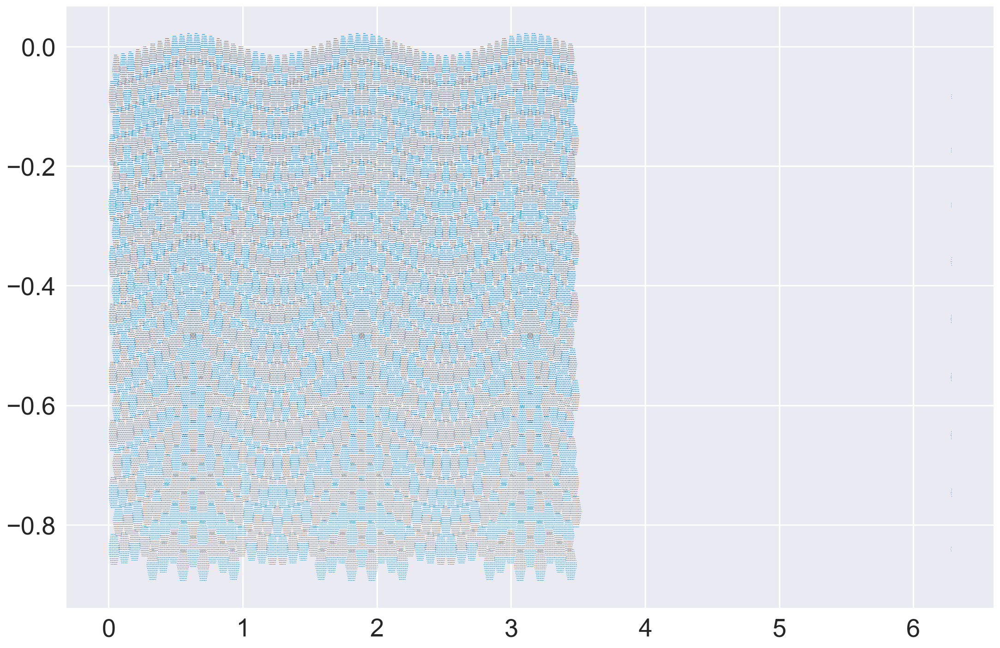

In [48]:
plt.plot(HexVisitY10.positions[:,0], HexVisitY10.positions[:,1],',')

In [4]:
%%time
RandomVisitY10 = ModelErrors('radial', WorstCase=False, DitherPattern='random_visit')
RandomVisitY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 3653 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 260016 visits
Running:  ['dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
number of stars dither positions:  260016
creating the models at every dither, this will take a while
averaging down and calculating residuals
moving back from moment space to elipticities
finding rhos
CPU times: user 4min 39s, sys: 9.19 s, total: 4min 48s
Wall time: 4min 59s


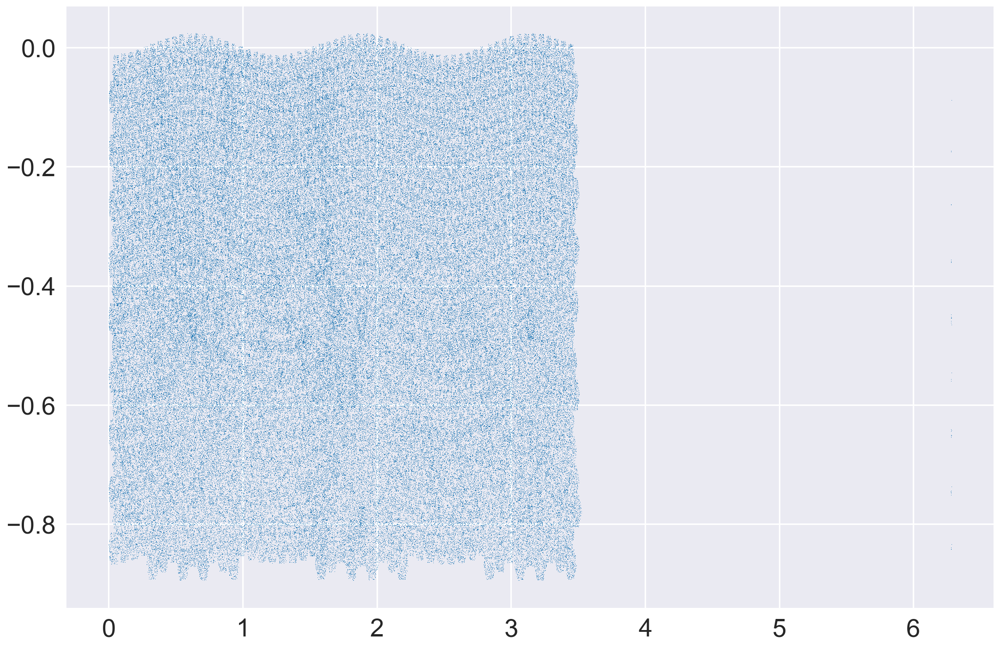

In [49]:
plt.plot(RandomVisitY10.positions[:,0], RandomVisitY10.positions[:,1],',')

In [18]:
%%time
SpiralVisitY10 = ModelErrors('radial', WorstCase=False, DitherPattern='spiral_visit')
SpiralVisitY10.process(sqlWhere='filter = "r" and night < 3653 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database
spiralDitherFieldPerVisit
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 3653 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 260016 visits
Running:  ['spiralDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
number of stars dither positions:  260016
creating the models at every dither, this will take a while
averaging down and calculating residuals
moving back from moment space to elipticities
finding rhos
CPU times: user 4min 50s, sys: 7.59 s, total: 4min 57s
Wall time: 5min 18s


In [60]:
sts = []
pvalues = []
for angles in HexVisitY10.savedStarsAngles.values():
    #plt.hist(angles,alpha=0.2)
    sts.append(stats.kstest(angles,'uniform',args=(-90,180),N=10000).statistic)
    pvalues.append(stats.kstest(angles,'uniform',args=(-90,180),N=10000).pvalue)

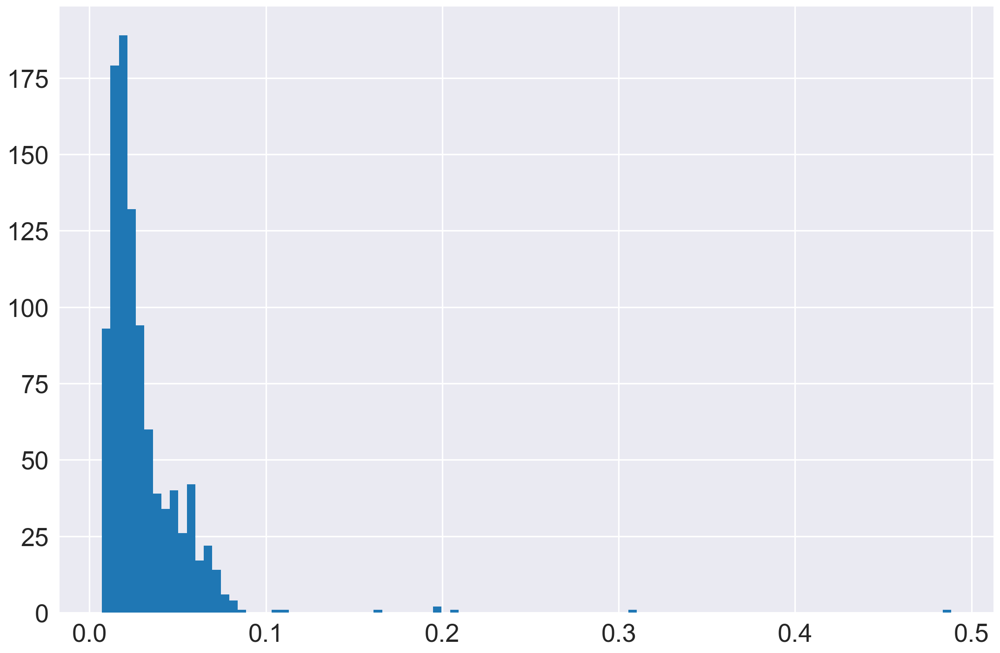

In [61]:
plt.hist(sts,bins=100);

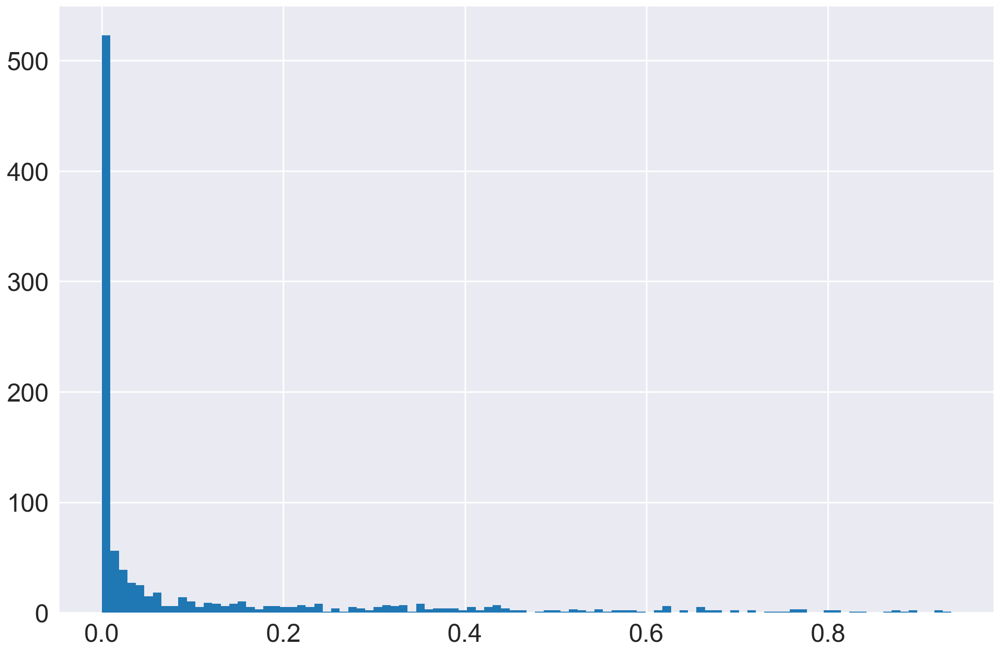

In [62]:
plt.hist(pvalues,bins=100);

### Stars whisker plot at y10

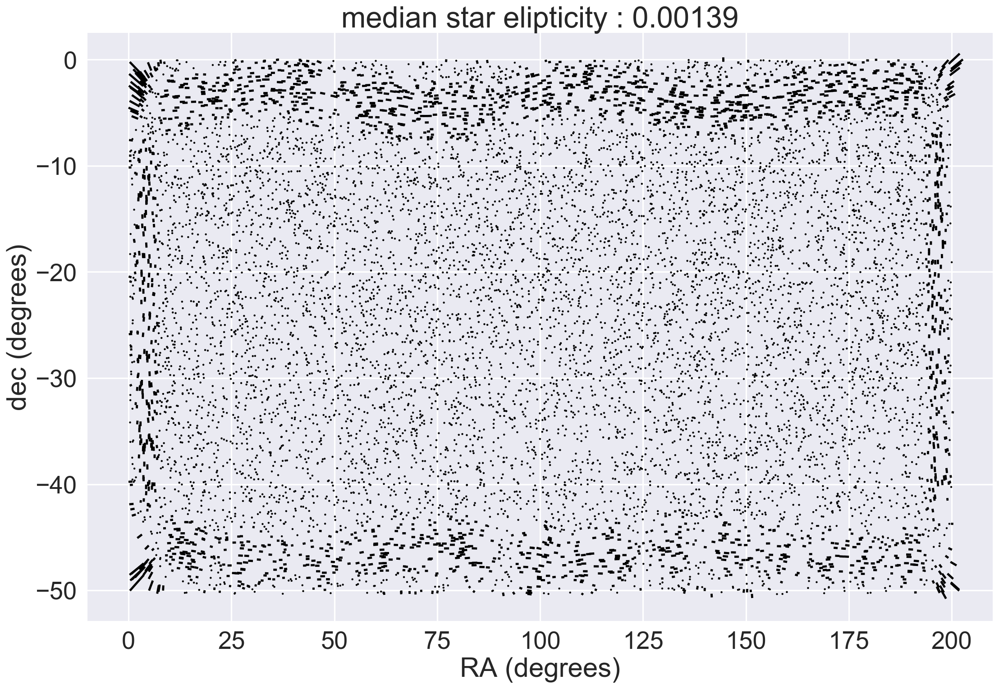

In [23]:
ditherplot(HexVisitY10.STAR, statistic='median', scale=1)
# qk = plt.quiverkey(Q, 0.8, 0.85, 0.005, r'$|e|=0.01$', labelpos='E', coordinates='figure')

### Residuals whisker plot at y10

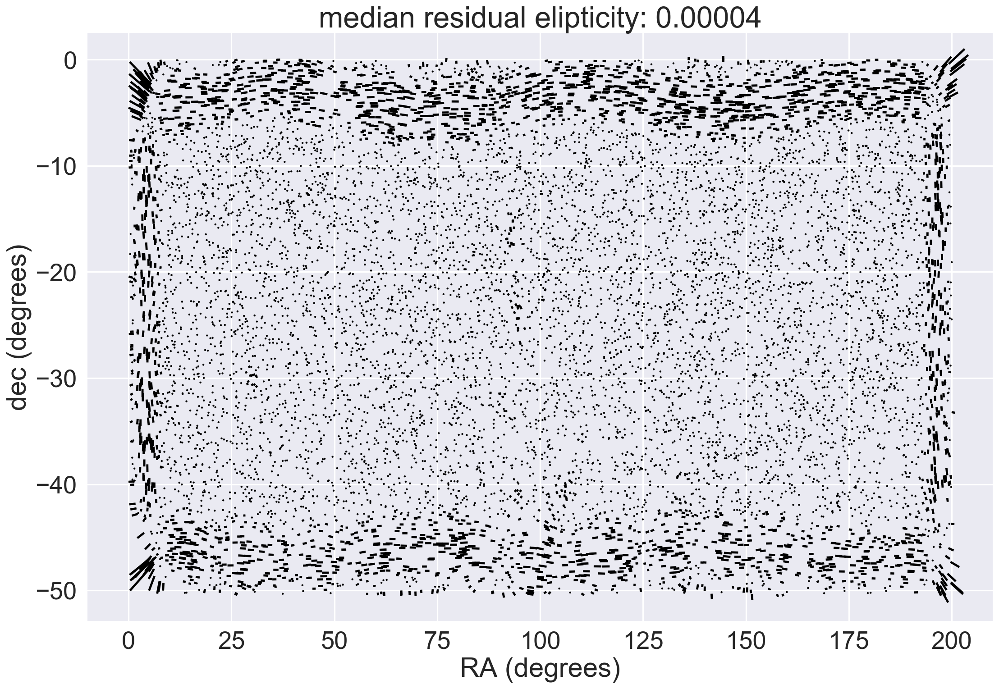

In [24]:
ditherplot(HexVisitY10.DELTA, statistic='median',scale=0.02)

In [35]:
mean(HexVisitY10.counter.values())

5204.9214000000002

In [90]:
HexVisitY10.rho2_sigma[1:]

array([  0.00000000e+00,   1.58583416e-08,   7.92917078e-09,
         4.57790888e-09,   3.63815307e-09,   2.13833834e-09,
         1.72007865e-09,   1.26162191e-09,   1.05958001e-09,
         7.29939336e-10,   5.30679166e-10,   3.91474499e-10,
         3.09700156e-10,   2.30509864e-10,   1.74785373e-10,
         1.41221306e-10,   1.15441061e-10,   1.01679018e-10,
         9.35127604e-11])

(0.01, 50)

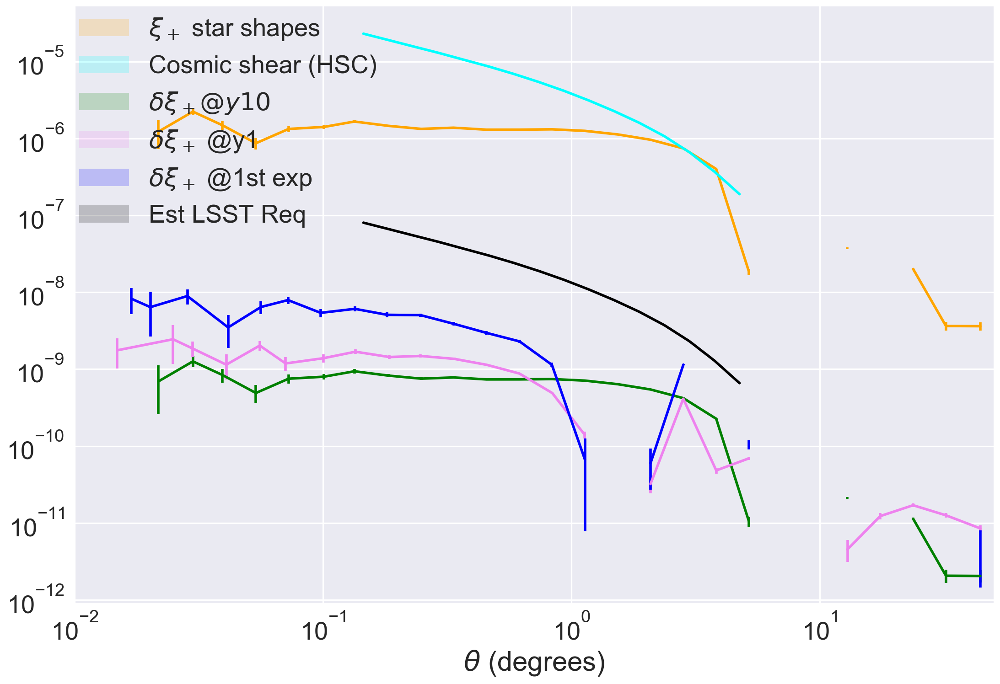

In [128]:
corrplot(HexVisitY10.r[1:], HexVisitY10.xip[1:], HexVisitY10.xip_sigma[1:],color='orange',scale='log')
corrplot(HexVisitY10.reqs_r[14:]*r2d(1), HexVisitY10.HSCCosmicShear_xip[14:], color='cyan')
# corrplot(HexVisitY10.r, HexVisitY10.rho1, abs(HexVisitY10.rho1_sigma),color='b',scale='log')
# corrplot(HexVisitY10.r, HexVisitY10.rho2, HexVisitY10.rho2_sigma,color='violet',scale='log')
corrplot(HexVisitY10.r[1:], HexVisitY10.delta_xip[1:], HexVisitY10.delta_xip_sigma[1:], color='green')
corrplot(HexVisitY1.r[1:], HexVisitY1.delta_xip[1:], HexVisitY1.delta_xip_sigma[1:], color='violet')
corrplot(NoDithers.r[1:], NoDithers.delta_xip[1:],NoDithers.delta_xip_sigma[1:], color='blue')
corrplot(r2d(1)*HexVisitY10.reqs_r[14:], HexVisitY10.rho134_reqs[14:], color='black', scale='log')
plt.legend([r'$\xi_+$ star shapes',r'Cosmic shear (HSC)',r'$\delta \xi_+ @y10$',r'$\delta \xi_+$ @y1',r'$\delta \xi_+$ @1st exp','Est LSST Req'],bbox_to_anchor=(0.34, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
#plt.yscale('symlog')
# plt.title('Figure 1. Comparison between PSF modelling errors, star shapes correlations, cosmic shear and estimated LSST requirements (from HSC)')

# Doing the same but at y1

In [54]:
y1 = ModelErrors('radial',WorstCase=False)

In [43]:
%%time
RandomVisitY1 = ModelErrors('radial', WorstCase=False, DitherPattern='random_visit')
RandomVisitY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database
randomDitherFieldPerVisit
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 365 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 27668 visits
Running:  ['randomDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
number of stars dither positions:  27668
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 39.1 s, sys: 2.91 s, total: 42 s
Wall time: 52.5 s


In [44]:
%%time
SpiralVisitY1 = ModelErrors('radial', WorstCase=False, DitherPattern='spiral_visit')
SpiralVisitY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database
spiralDitherFieldPerVisit
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 365 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 27668 visits
Running:  ['spiralDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
number of stars dither positions:  27668
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 39.4 s, sys: 2.87 s, total: 42.3 s
Wall time: 52.8 s


In [45]:
%%time
HexVisitY1 = ModelErrors('radial', WorstCase=False, DitherPattern='hex_visit')
HexVisitY1.process(sqlWhere='filter = "r" and night < 365 \
and fieldRA < {} and fieldDec > {} \
and fieldRA > 0 and fieldDec < 0'.format(np.radians(200), np.radians(-50)))

getting the dither positions from the database
hexDitherFieldPerVisit
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 365 and fieldRA < 3.49065850399 and fieldDec > -0.872664625997 and fieldRA > 0 and fieldDec < 0
Found 27668 visits
Running:  ['hexDitherFieldPerVisit dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
number of stars dither positions:  27668
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos
CPU times: user 39.8 s, sys: 2.94 s, total: 42.8 s
Wall time: 54.7 s


In [9]:
sts = []
pvalues = []
for angles in y1.savedStarsAngles.values():
    #plt.hist(angles,alpha=0.2)
    sts.append(stats.kstest(angles,'uniform',args=(-90,180),N=10000).statistic)
    pvalues.append(stats.kstest(angles,'uniform',args=(-90,180),N=10000).pvalue)

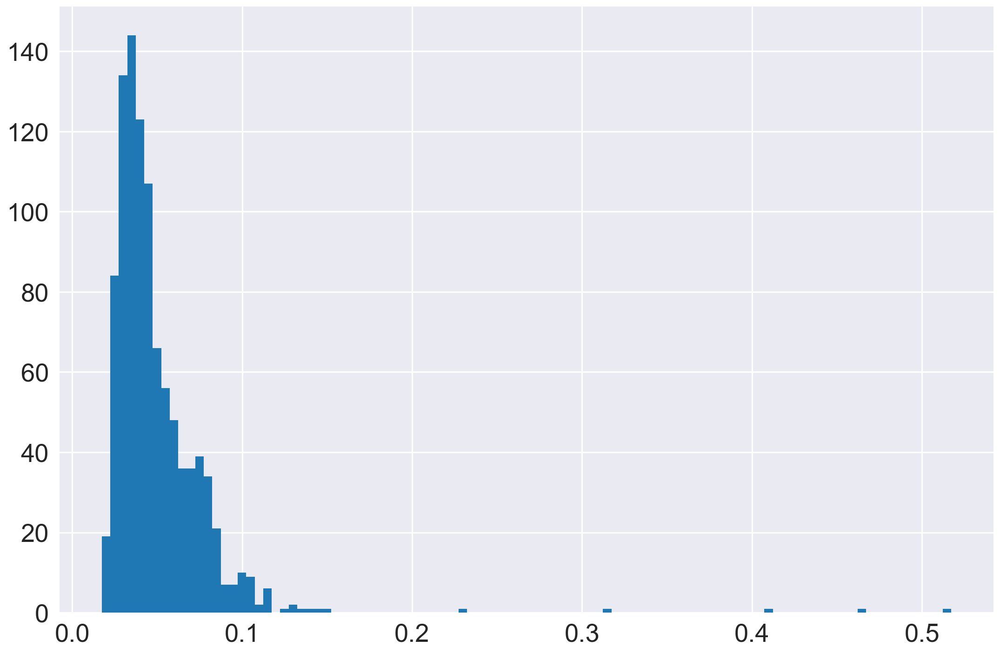

In [10]:
plt.hist(sts,bins=100);

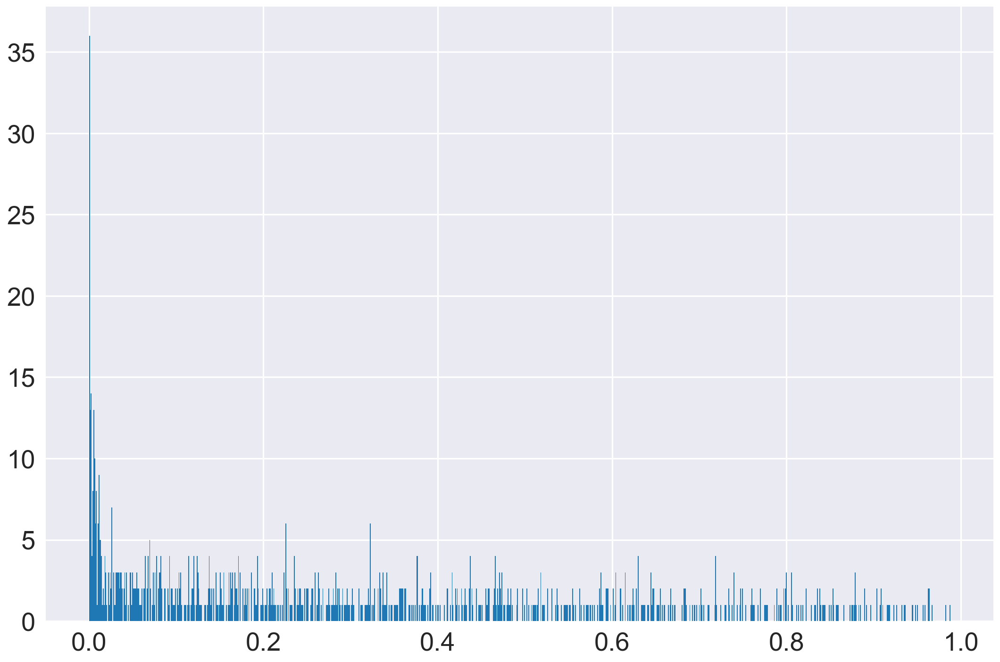

In [12]:
plt.hist(pvalues,bins=1000);

### Star whisker plot at y1 -- Random dithers

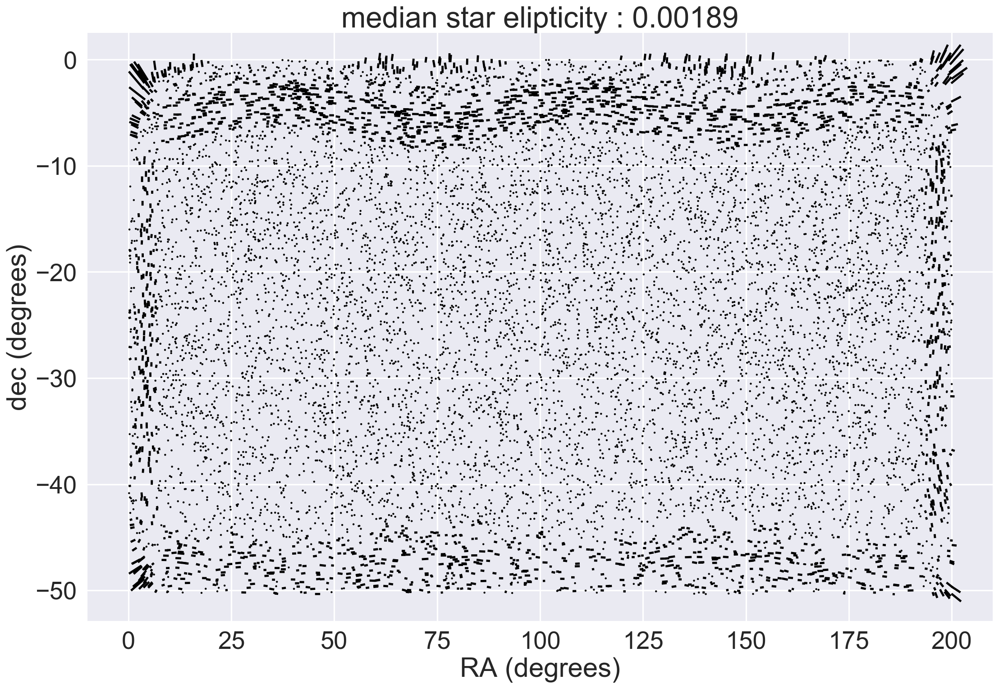

In [54]:
ditherplot(RandomVisitY1.STAR, statistic='median',scale=1)

### Residuals whisker plot at y1 -- Random dithers

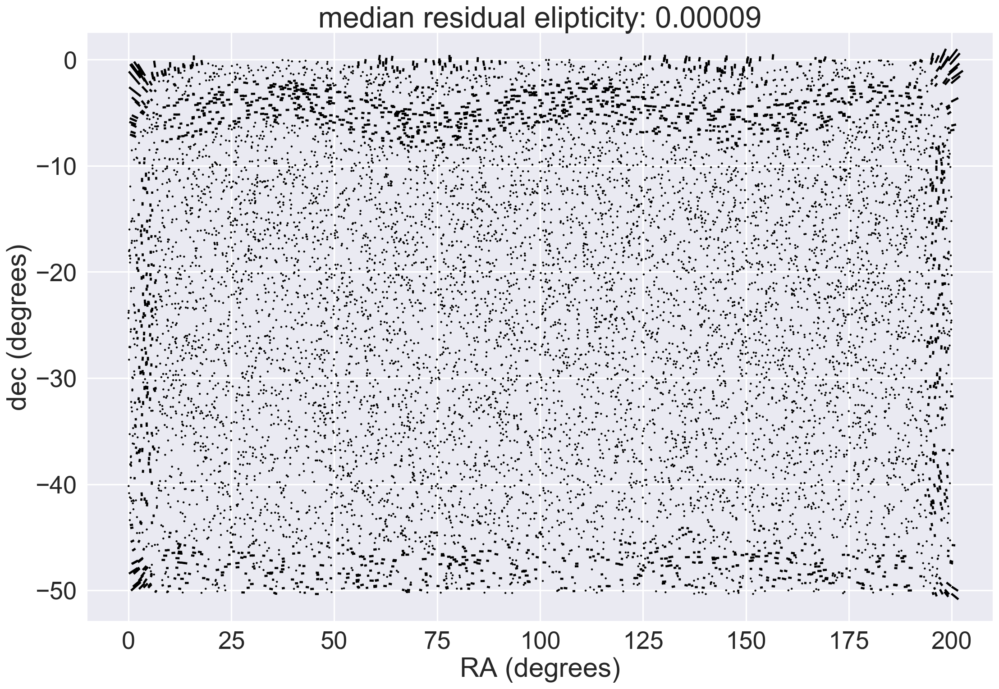

In [72]:
ditherplot(RandomVisitY1.DELTA, statistic='mean',scale=0.04)

Text(0.5,1,u'KS-test statistic')

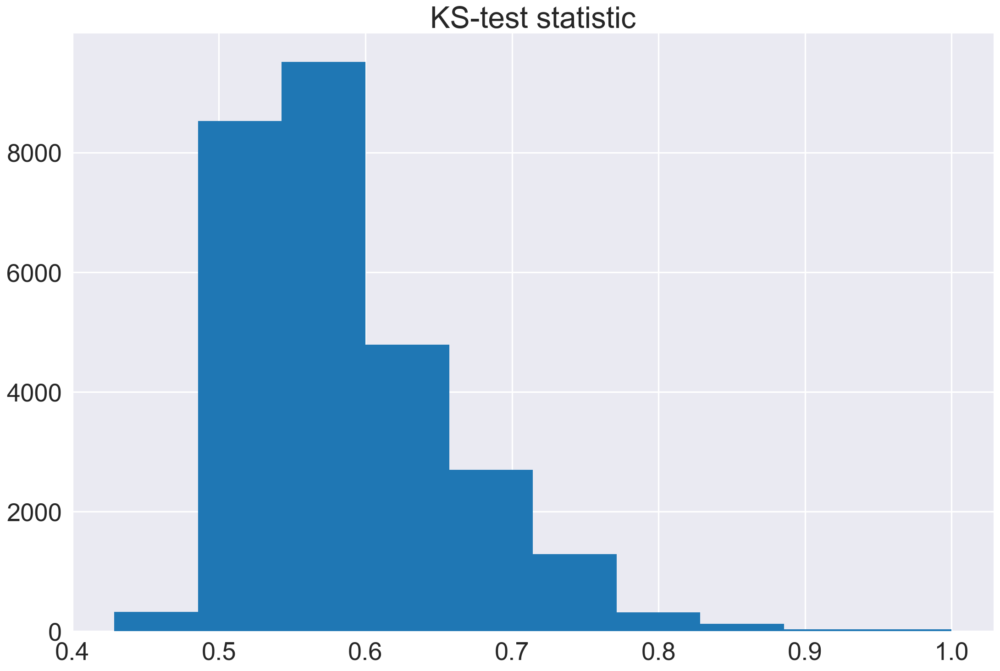

In [23]:
plt.hist(y1.ksstatistic)
plt.title('KS-test statistic')

# Comparison across dither patterns at Y10

In [39]:
sns.set_context('poster')

Text(0,0.5,u'$\\delta \\xi_+$')

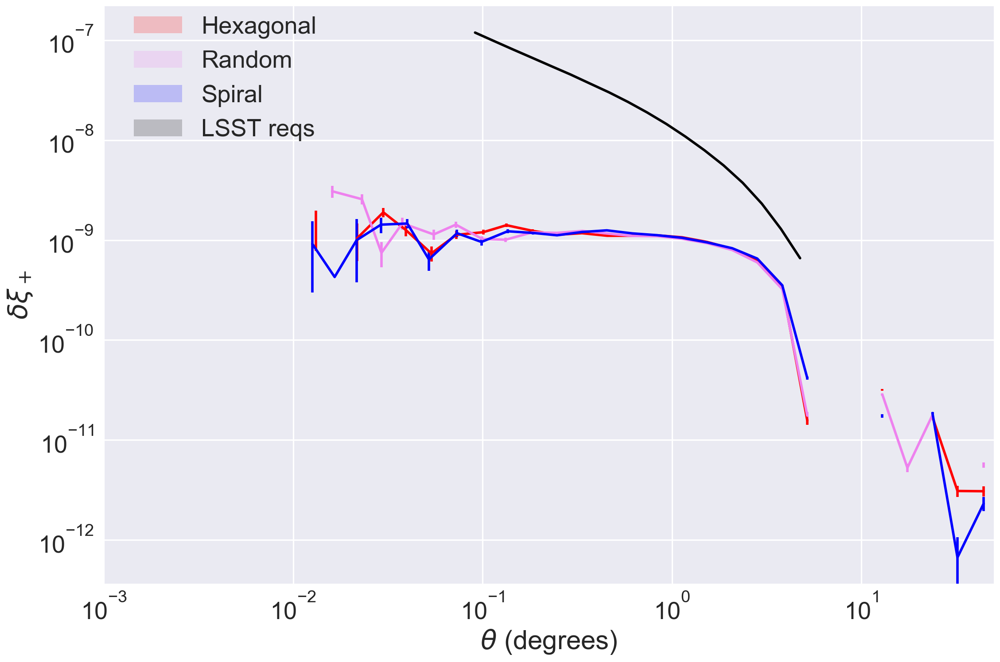

In [70]:
corrplot(HexVisitY10.r, HexVisitY10.rho1, HexVisitY10.rho1_sigma,color='r',scale='log')
corrplot(RandomVisitY10.r, RandomVisitY10.rho1, RandomVisitY10.rho1_sigma,color='violet',scale='log')
corrplot(SpiralVisitY10.r, SpiralVisitY10.rho1, SpiralVisitY10.rho1_sigma,color='b',scale='log')
corrplot(r2d(1)*HexVisitY10.reqs_r[12:], HexVisitY10.rho134_reqs[12:], color='black',scale='log')

plt.legend([r'Hexagonal',r'Random',r'Spiral',r'LSST reqs'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.001, 50))
plt.ylabel(r'$\delta \xi_+$')

(-5, 11)

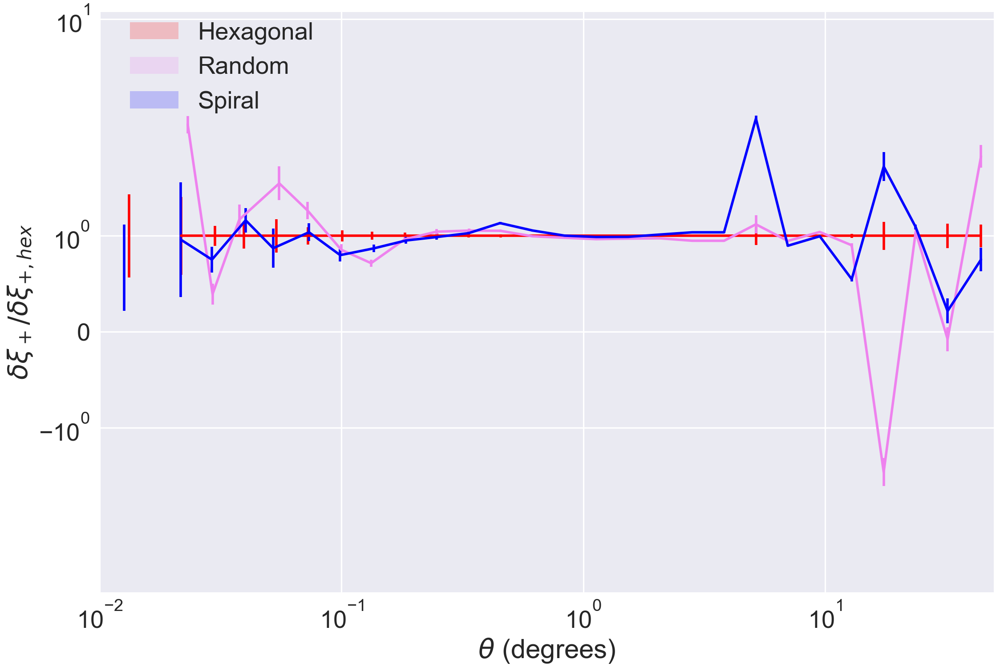

In [135]:
corrplot(HexVisitY10.r, HexVisitY10.rho1/HexVisitY10.rho1, HexVisitY10.rho1_sigma/HexVisitY10.rho1,color='r',scale='log')
corrplot(RandomVisitY10.r, RandomVisitY10.rho1/HexVisitY10.rho1, RandomVisitY10.rho1_sigma/HexVisitY10.rho1,color='violet',scale='log')
corrplot(SpiralVisitY10.r, SpiralVisitY10.rho1/HexVisitY10.rho1, SpiralVisitY10.rho1_sigma/HexVisitY10.rho1,color='b',scale='log')

plt.legend([r'Hexagonal',r'Random',r'Spiral'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
plt.ylabel(r'$\delta \xi_+/\delta \xi_{+,hex}$')
plt.yscale('symlog')
plt.ylim((-5, 11))



## How about at Year 1?

Text(0,0.5,u'$\\delta \\xi_+$')

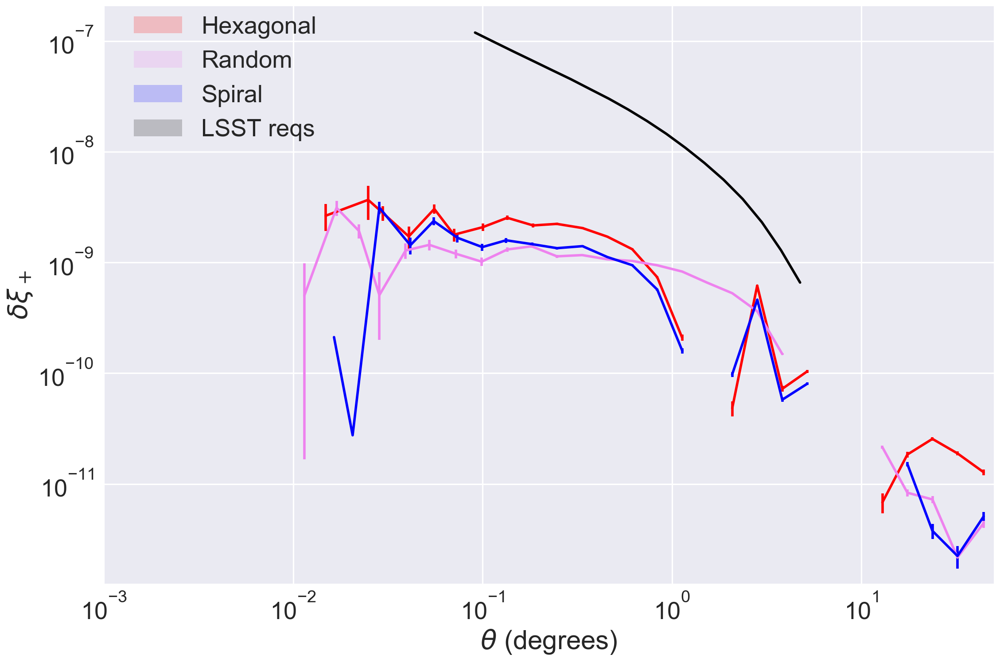

In [69]:
corrplot(HexVisitY1.r, HexVisitY1.rho1, HexVisitY1.rho1_sigma,color='r',scale='log')
corrplot(RandomVisitY1.r, RandomVisitY1.rho1, RandomVisitY1.rho1_sigma,color='violet',scale='log')
corrplot(SpiralVisitY1.r, SpiralVisitY1.rho1, SpiralVisitY1.rho1_sigma,color='b',scale='log')
corrplot(r2d(1)*HexVisitY10.reqs_r[12:], HexVisitY10.rho134_reqs[12:], color='black',scale='log')

plt.legend([r'Hexagonal',r'Random',r'Spiral',r'LSST reqs'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.001, 50))
plt.ylabel(r'$\delta \xi_+$')

(-5, 11)

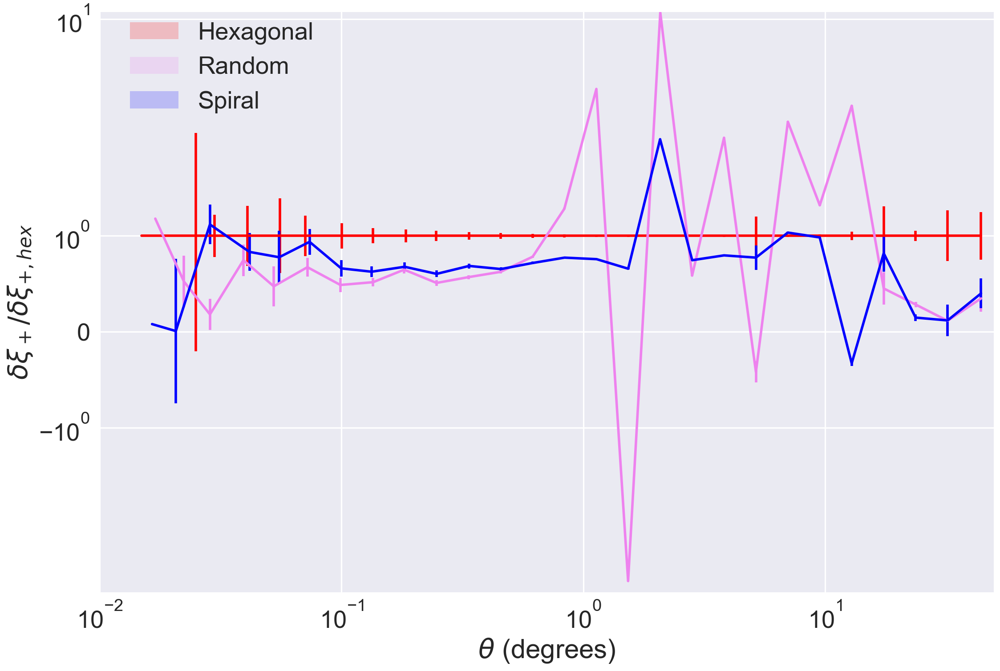

In [136]:
corrplot(HexVisitY1.r, HexVisitY1.rho1/HexVisitY1.rho1, HexVisitY1.rho1_sigma/HexVisitY10.rho1,color='r',scale='log')
corrplot(RandomVisitY1.r, RandomVisitY1.rho1/HexVisitY1.rho1, RandomVisitY1.rho1_sigma/HexVisitY10.rho1,color='violet',scale='log')
corrplot(SpiralVisitY1.r, SpiralVisitY1.rho1/HexVisitY1.rho1, SpiralVisitY1.rho1_sigma/HexVisitY10.rho1,color='b',scale='log')

plt.legend([r'Hexagonal',r'Random',r'Spiral'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
plt.ylabel(r'$\delta \xi_+/\delta \xi_{+,hex}$')
plt.yscale('symlog')
plt.ylim((-5, 11))




### How much better is $\rho_1$ at y10 than y1?

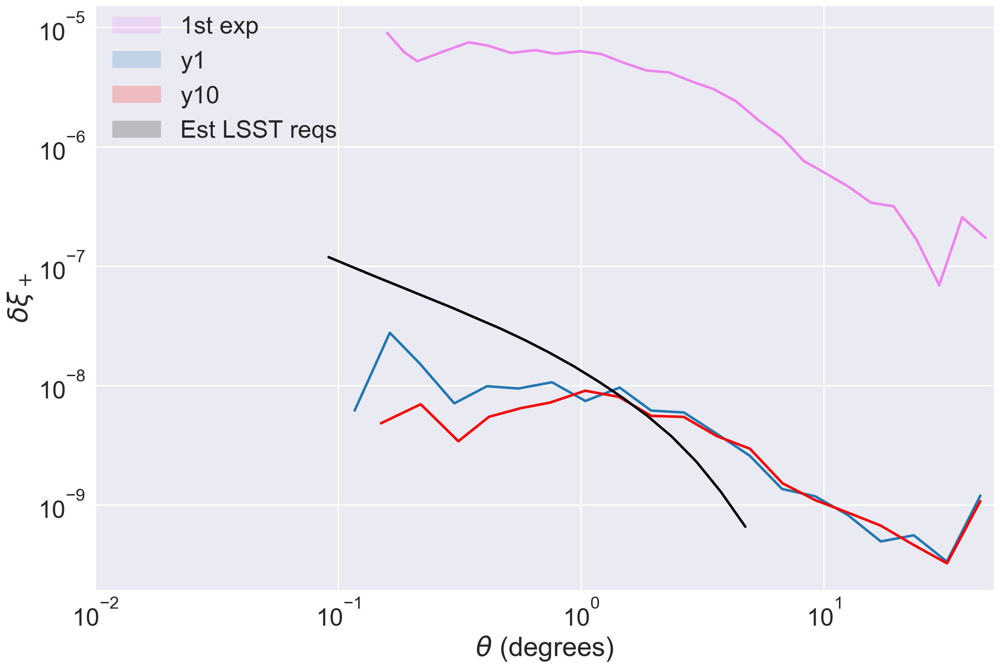

In [127]:
sns.tsplot(abs(NoDithers.delta_xip), NoDithers.r,color='violet')
sns.tsplot(abs(HexVisitY1.delta_xip),y1.r)#,err_style='std_bars')
sns.tsplot(abs(HexVisitY10.delta_xip),HexVisitY10.r,color='r')#,err_style='std_bars')
sns.tsplot(abs(HexVisitY10.rho134_reqs[12:]),r2d(1)*HexVisitY10.reqs_r[12:],color='black')
plt.xlabel(r'$\theta$ (degrees)')
plt.ylabel(r'$\delta \xi_+$')
plt.xscale('log')
plt.yscale('log')
# plt.title(r'\')
plt.xlim((0.01,50))
plt.legend([r'1st exp',r'y1',r'y10',r'Est LSST reqs'],bbox_to_anchor=(0.28, 1), loc='upper right', borderaxespad=0.)

## Comparison between Y1 and Y10 across dither patterns:

(5e-13, 1e-08)

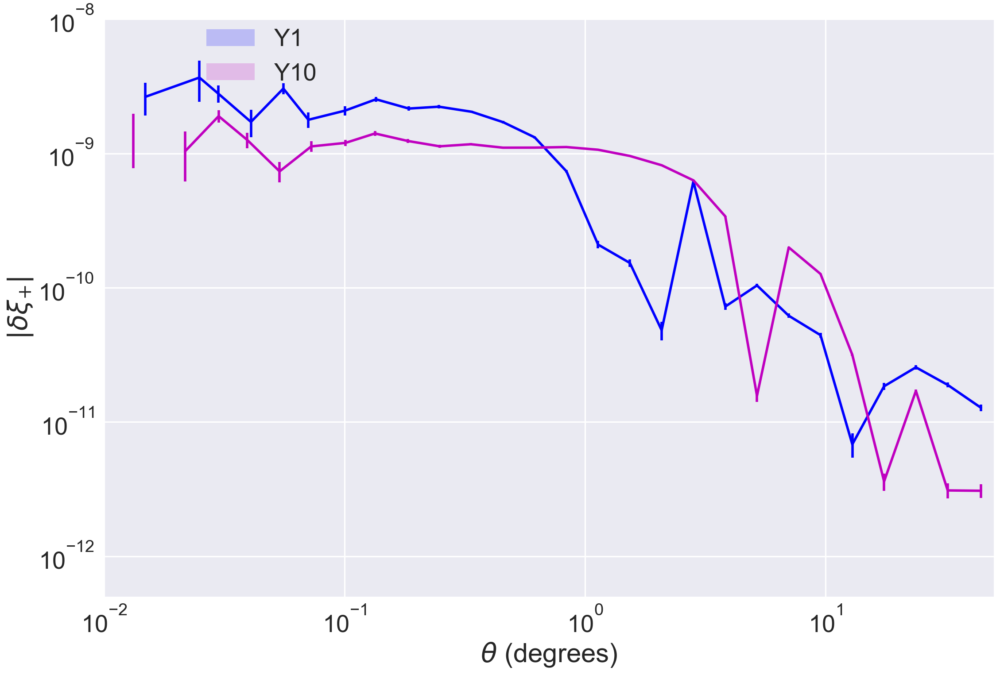

In [122]:
corrplot(HexVisitY1.r, abs(HexVisitY1.rho1), HexVisitY1.rho1_sigma,color='b',scale='log')
corrplot(HexVisitY10.r, abs(HexVisitY10.rho1), HexVisitY10.rho1_sigma,color='m',scale='log')


plt.legend([r'Y1',r'Y10'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
plt.ylabel(r'$|\delta \xi_{+}|$')
#plt.yscale('symlog')
plt.ylim((5*10**(-13)),10**(-8))



(5e-13, 1e-08)

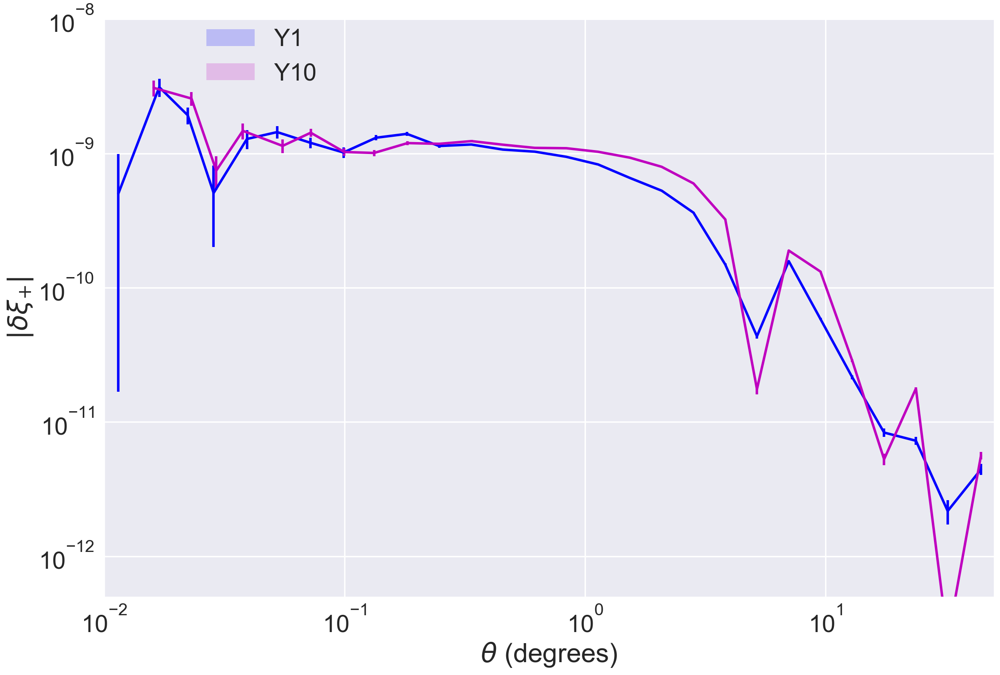

In [121]:
corrplot(RandomVisitY1.r, abs(RandomVisitY1.rho1), RandomVisitY1.rho1_sigma,color='b',scale='log')
corrplot(RandomVisitY10.r, abs(RandomVisitY10.rho1), RandomVisitY10.rho1_sigma,color='m',scale='log')


plt.legend([r'Y1',r'Y10'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
plt.ylabel(r'$|\delta \xi_{+}|$')
#plt.yscale('symlog')
plt.ylim((5*10**(-13)),10**(-8))




(5e-13, 1e-08)

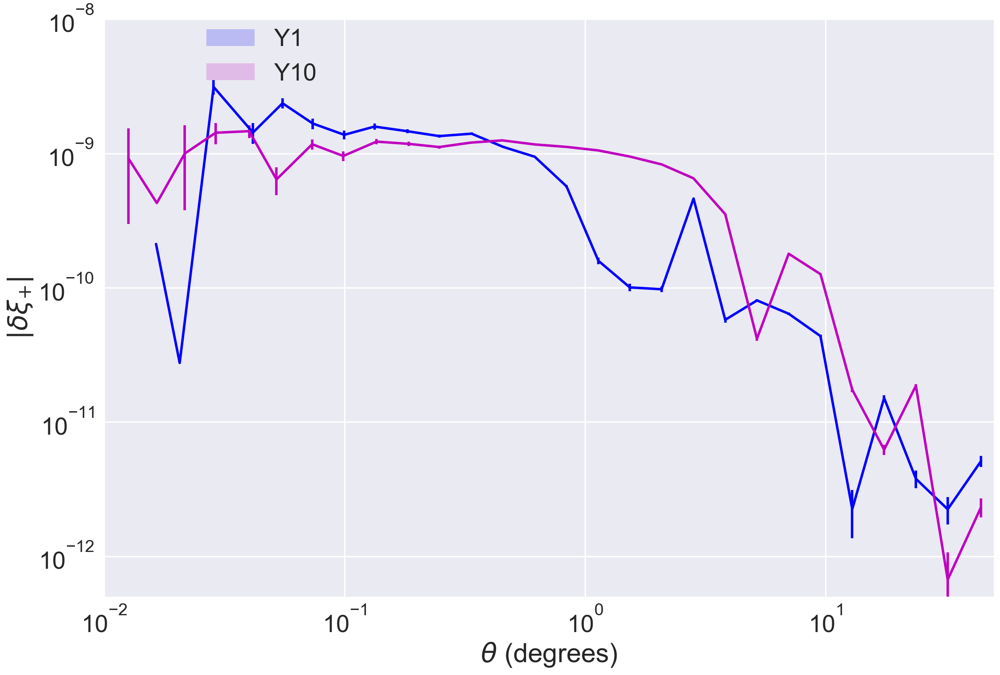

In [120]:
corrplot(SpiralVisitY1.r, abs(SpiralVisitY1.rho1), SpiralVisitY1.rho1_sigma,color='b',scale='log')
corrplot(SpiralVisitY10.r, abs(SpiralVisitY10.rho1), SpiralVisitY10.rho1_sigma,color='m',scale='log')


plt.legend([r'Y1',r'Y10'],bbox_to_anchor=(0.25, 1), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
plt.ylabel(r'$|\delta \xi_{+}|$')
plt.ylim((5*10**(-13)),10**(-8))
#plt.yscale('symlog')
#plt.ylim((-5, 11))



(-5, 11)

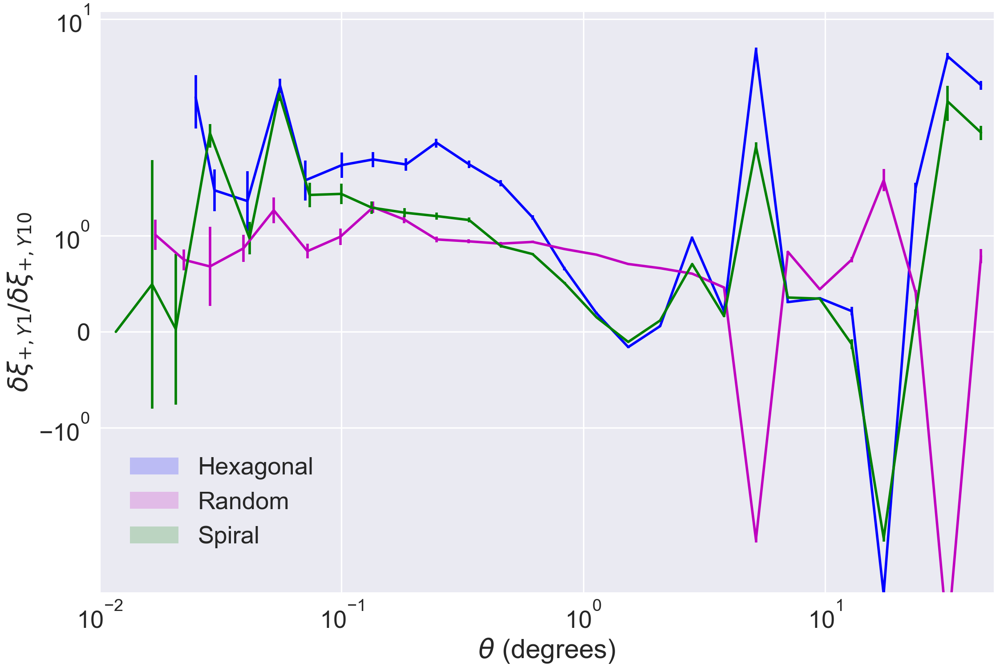

In [139]:
corrplot(HexVisitY1.r, HexVisitY1.rho1/HexVisitY10.rho1, HexVisitY1.rho1_sigma/HexVisitY10.rho1,color='b',scale='log')
corrplot(RandomVisitY1.r, RandomVisitY1.rho1/RandomVisitY10.rho1, RandomVisitY1.rho1_sigma/RandomVisitY10.rho1,color='m',scale='log')
corrplot(SpiralVisitY1.r, SpiralVisitY1.rho1/SpiralVisitY10.rho1, SpiralVisitY1.rho1_sigma/SpiralVisitY10.rho1,color='g',scale='log')



plt.legend([r'Hexagonal',r'Random',r'Spiral'],bbox_to_anchor=(0.25, 0.25), loc='upper right', borderaxespad=0.)
plt.xlim((0.01, 50))
plt.ylabel(r'$\delta \xi_{+,Y1}/\delta \xi_{+,Y10}$')
plt.yscale('symlog')
plt.ylim((-5, 11))



## Finally, doing the same but for no dithering:

In [109]:
NoDithers = ModelErrors('radial',False,'field')

In [110]:
## %%time
NoDithers.process(sqlWhere='filter = "r" and night < 3650 and fieldRA < %f and fieldDec > %f and fieldRA > 0 and fieldDec < 0' % (np.radians(200), np.radians(-50)))

getting the dither positions from the database
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Querying database with constraint filter = "r" and night < 3650 and fieldRA < 3.490659 and fieldDec > -0.872665 and fieldRA > 0 and fieldDec < 0
Found 260016 visits
Running:  ['field dither']
Completed metric generation.
Running reduce methods.
Running summary statistics.
Completed.
field
number of stars dither positions:  260016
creating the models at every dither, this will take a while
moving back from moment space to elipticities
finding rhos


Text(0.5,1,u'focal plane centers')

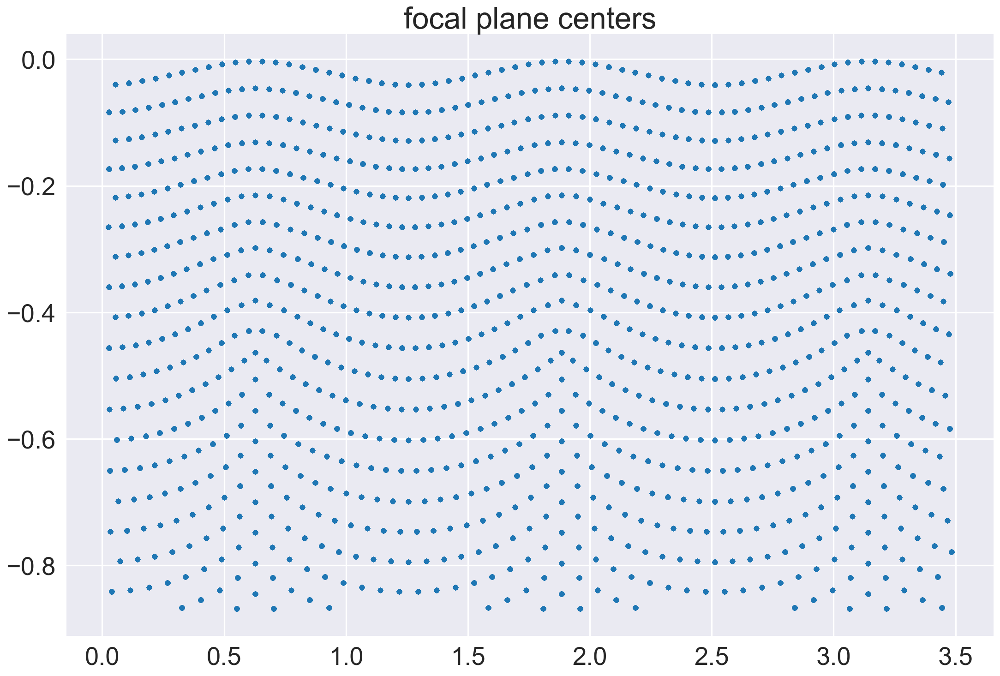

In [133]:
plt.plot(NoDither.positions[:,0], NoDither.positions[:,1],'.')
plt.title('focal plane centers')

## Star whisker plot with no dithering
This is different to the first exposure, since even without dithering, stars will still be seen by several exposures (but a much smaller number than with actual dither patterns).

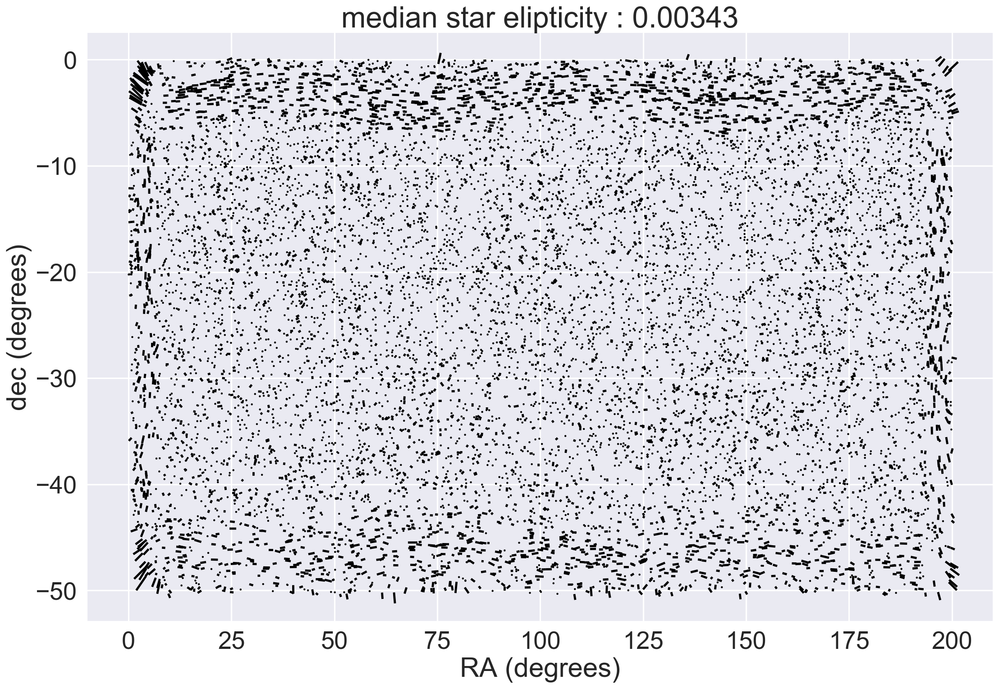

In [103]:
ditherplot(NoDithers.STAR, statistic='median',scale=1)

## Residuals whisker plot with no dithering

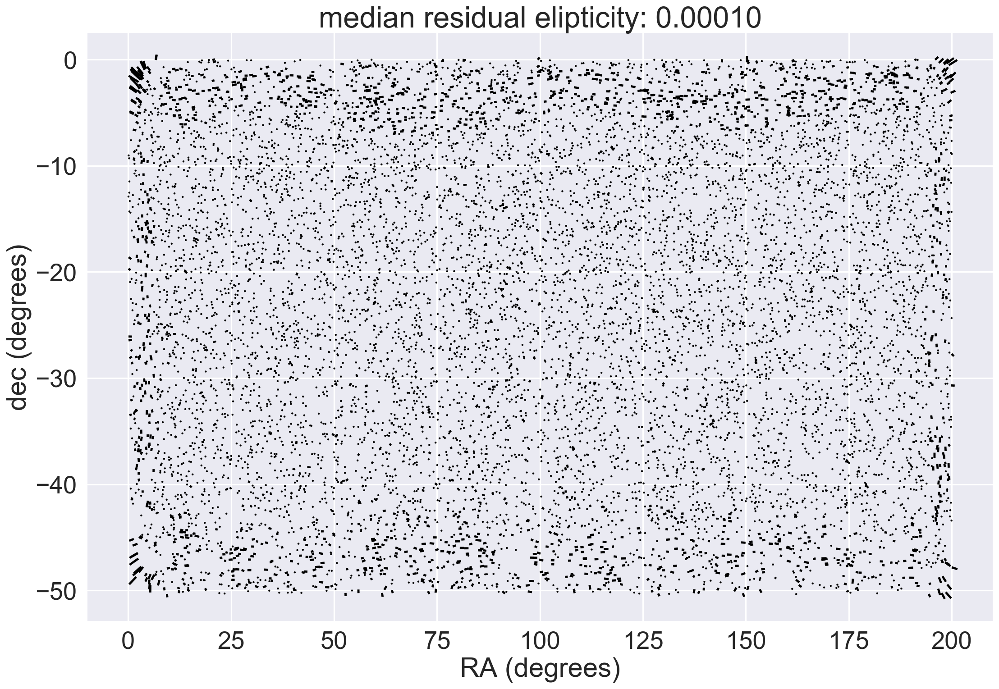

In [126]:
ditherplot(NoDithers.DELTA, statistic='median',scale=0.05)